# PART A - K Nearest Neighbours

In [38]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tabulate import tabulate
from numpy.linalg import norm
from tabulate import tabulate
from operator import itemgetter
import time

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from skmultilearn.problem_transform import LabelPowerset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, hamming_loss
from sklearn.metrics import multilabel_confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold
from sklearn.preprocessing import OneHotEncoder, MultiLabelBinarizer
from sklearn.multioutput import MultiOutputClassifier

mlb = MultiLabelBinarizer()

In [39]:
data = np.load('data.npy', allow_pickle=True)
data_df = pd.DataFrame(data)

In [40]:
# Col 1 - Game ID
# Col 2 - Embeddings by ResNet
# Col 3 - Embeddings by VIT
# Col 4 - Label Name (Ground Truth)
# Col 5 - Guess Time

data_df.head()

,0,1,2,3,4
0,9f894201-9d0d-4f75-853b-595c0c1bd661,"[[-0.001002429, 0.047839083, -0.0046581626, 0....","[[0.31094703, 0.20213455, -0.16519593, -0.0530...",sleep,33.144312
1,d2b4d879-0345-4df1-a978-eb7f9e8b89f1,"[[-0.013190677, 0.08283211, 0.006474074, 0.001...","[[-0.07832227, -0.07557866, -0.05214904, -0.32...",oven,98.512848
2,aaf0c209-f3a7-4c91-9a09-bc1e30400c4c,"[[-0.010499587, 0.047467805, -0.019303396, -0....","[[0.31455985, -0.024428558, 0.33139282, 0.2197...",chair,15.449425
3,5ae313c7-9934-456c-9685-36ef20b712fd,"[[-0.023966337, 0.024375185, -0.0009961016, -0...","[[0.113364324, -0.23683439, 0.34781978, -0.427...",igloo,43.358541
4,b58bbb2c-461f-4805-856e-cba323f97e8c,"[[-0.018555297, 0.050565578, -0.008821793, 0.0...","[[0.22332864, -0.28626534, -0.037617087, -0.17...",fish,14.454734


In [41]:
unique_counts = data_df[3].value_counts()

### Distribution of various labels

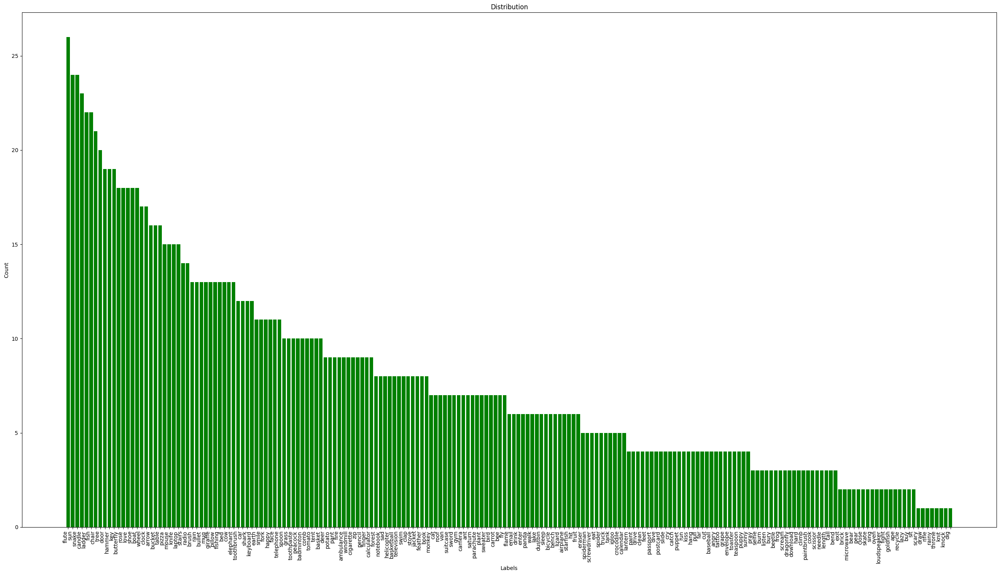

In [42]:
plt.figure(figsize=(26,15))

plt.bar(unique_counts.index, unique_counts.values, color='green')
plt.title('Distribution')
plt.xlabel('Labels')
plt.ylabel('Count')

plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

### KNN Class with custom encoder type, k, and distance metric

In [43]:
class KNN:
    def __init__(self, k=3, distance_metric="Euclidean", encoder="ResNet", split=0.2):
        self.k = k
        self.distance_metric=distance_metric
        self.encoder = encoder
        self.x_train = None
        self.y_train = None
        self.x_val = None
        self.y_val = None
        self.split = split
        self.set_data()
        
    def set_data(self):
        if(self.encoder == 'ResNet'):
            self.x_train, self.x_val, self.y_train, self.y_val = train_test_split(data_df[1], data_df[3], test_size=self.split, random_state=42, shuffle=True)
        elif(self.encoder == 'VIT'):
            self.x_train, self.x_val, self.y_train, self.y_val = train_test_split(data_df[2], data_df[3], test_size=self.split, random_state=42, shuffle=True)
                    
    def calc_distance_euclidean(self, x1, x2):
        dist = np.sqrt(np.sum((x1 - x2) ** 2))
        return dist
    
    def calc_distance_manhattan(self, x1, x2):
        dist = np.sum(np.abs(x1 - x2))
        return dist
    
    def calc_distance_cosine(self, x1, x2):
        dot_product = np.dot(x1.reshape(-1), x2.reshape(-1))
        norm_x1 = norm(x1)
        norm_x2 = norm(x2)

        if norm_x1 == 0 or norm_x2 == 0:
            return 1

        cosine_similarity = dot_product / (norm_x1 * norm_x2)
        cosine_distance = 1 - cosine_similarity
        return cosine_distance
    
    def predict(self, x, x_train, y_train):
        distances = []
        label_count = dict()
        label_weights = dict()
    
        for point, label in zip(x_train, y_train):
            if self.distance_metric == "Euclidean":
                dist = self.calc_distance_euclidean(x, point)
            elif self.distance_metric == "Manhattan":
                dist = self.calc_distance_manhattan(x, point)
            elif self.distance_metric == "Cosine":
                dist = self.calc_distance_cosine(x, point)
            distances.append((dist, label))
    
        distances.sort(key=lambda x: x[0])
    
        for i in range(0, self.k):
            curr_dist, curr_label = distances[i]
            if curr_label in label_count:
                label_count[curr_label] += 1
            else:
                label_count[curr_label] = 1
        
            weight = 1 / (curr_dist + 1e-6)
            if curr_label in label_weights:
                label_weights[curr_label] += weight
            else:
                label_weights[curr_label] = weight
    
        max_count = max(label_count.values())
        potential_labels = []
        for label, count in label_count.items():
            if count == max_count:
                potential_labels.append(label)
    
        if len(potential_labels) == 1:
            return potential_labels[0]
        else:
            max_weight_label = max(potential_labels, key=lambda label: label_weights.get(label, 0))
            return max_weight_label

    def inference(self, x):
        print(self.predict(x))
    
    def evaluate_metrics(self, x_train, y_train, x_val, y_val):
        predictions = []
        for x in x_val:
            predictions.append(self.predict(x, x_train, y_train))
        accuracy = accuracy_score(y_val, predictions)
        precision = precision_score(y_val, predictions, average='weighted', zero_division=1)
        recall = recall_score(y_val, predictions, average='weighted', zero_division=1)
        f1_micro = f1_score(y_val, predictions, average='micro')
        f1_macro = f1_score(y_val, predictions, average='macro')
        f1_weighted = f1_score(y_val, predictions, average='weighted')
        
        return accuracy, precision, recall, f1_micro, f1_macro, f1_weighted

In [44]:
knn = KNN(k=12, distance_metric="Manhattan", encoder="VIT", split=0.2)
accuracy, precision, recall, f1_micro, f1_macro, f1_weighted = knn.evaluate_metrics(knn.x_train, knn.y_train, knn.x_val, knn.y_val)

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score (Micro): ", f1_micro)
print("F1 Score (Macro): ", f1_macro)
print("F1 Score (Weighted): ", f1_weighted)

Accuracy:  0.3
Precision:  0.5381082463288345
Recall:  0.3
F1 Score (Micro):  0.3
F1 Score (Macro):  0.18161225978178847
F1 Score (Weighted):  0.2720881259973332


### Hyperparameter Tuning

In [45]:
best_accuracy = 0.0
parameters = []
best_triplet = []

for k in range(1, int(np.sqrt(len(data_df)))):
    for encoder in ["ResNet", "VIT"]:
        for distance_metric in ["Euclidean", "Manhattan", "Cosine"]:
            knn = KNN(k, distance_metric, encoder)
            accuracy, precision, recall, f1_micro, f1_macro, f1_weighted = knn.evaluate_metrics(knn.x_train, knn.y_train, knn.x_val, knn.y_val)
            
            if(accuracy > best_accuracy):
                best_accuracy = accuracy
                best_triplet.clear()
                best_triplet.append(k)
                best_triplet.append(encoder)
                best_triplet.append(distance_metric)
            curr_parameters = {"accuracy": accuracy, "k": k, "encoder": encoder, "distance_metric": distance_metric}
            parameters.append(curr_parameters)

### Best Triplet

In [46]:
table_data = [["Parameter", "Best Value"],
              ["k", best_triplet[0]],
              ["Encoder", best_triplet[1]],
              ["Distance Metric", best_triplet[2]]]

table = tabulate(table_data, tablefmt="grid")
print(table)

+-----------------+------------+
| Parameter       | Best Value |
+-----------------+------------+
| k               | 12         |
+-----------------+------------+
| Encoder         | VIT        |
+-----------------+------------+
| Distance Metric | Manhattan  |
+-----------------+------------+


### Ordered List of 20 triplets

In [47]:
parameters_final = sorted(parameters, key=itemgetter('accuracy'), reverse=True)

headers = ["Accuracy", "k", "Encoder", "Distance Metric"]
table_data = []

for x in parameters_final[:20]:
    table_data.append([x['accuracy'], x['k'], x['encoder'], x['distance_metric']])

table = tabulate(table_data, headers=headers, tablefmt="grid")
print(table)

+------------+-----+-----------+-------------------+
|   Accuracy |   k | Encoder   | Distance Metric   |
+============+=====+===========+===================+
|   0.3      |  12 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.296667 |  13 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.293333 |   4 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.286667 |  14 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.28     |   3 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.28     |  10 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.28     |  11 | VIT       | Manhattan         |
+------------+-----+-----------+-------------------+
|   0.276667 |   1 | VIT       | Manhattan         |
+------------+-----+-----------+--------------

In [48]:
resnet_euc = []
resnet_man = []
resnet_cosine = []
vit_euc = []
vit_man = []
vit_cosine = []

for x in parameters:
    if x['encoder'] == 'ResNet' and x['distance_metric'] == 'Euclidean':
        resnet_euc.append(x)
    elif x['encoder'] == 'ResNet' and x['distance_metric'] == 'Manhattan':
        resnet_man.append(x)
    elif x['encoder'] == 'ResNet' and x['distance_metric'] == 'Cosine':
        resnet_cosine.append(x)
    elif x['encoder'] == 'VIT' and x['distance_metric'] == 'Euclidean':
        vit_euc.append(x)
    elif x['encoder'] == 'VIT' and x['distance_metric'] == 'Manhattan':
        vit_man.append(x)
    elif x['encoder'] == 'VIT' and x['distance_metric'] == 'Cosine':
        vit_cosine.append(x)

### k vs Accuracy Plots

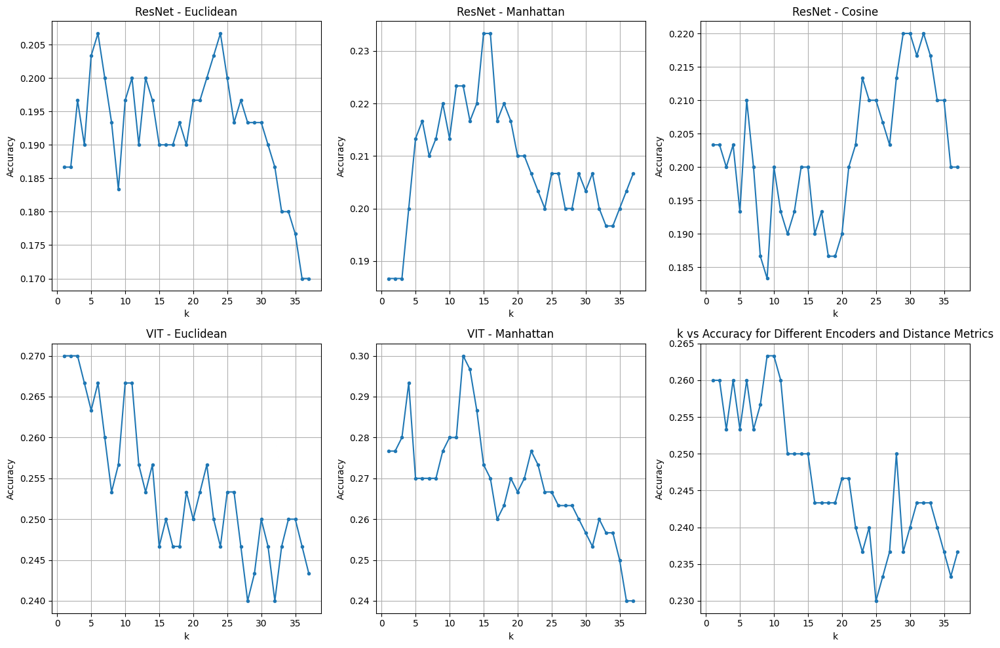

In [49]:
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

def plot_graph(data, title, ax):
    k_values = [x['k'] for x in data]
    accuracy_values = [x['accuracy'] for x in data]
    ax.plot(k_values, accuracy_values, marker='.')
    ax.set_title(title)
    ax.set_xlabel('k')
    ax.set_ylabel('Accuracy')
    ax.grid(True)

plot_graph(resnet_euc, 'ResNet - Euclidean', axs[0, 0])
plot_graph(resnet_man, 'ResNet - Manhattan', axs[0, 1])
plot_graph(resnet_cosine, 'ResNet - Cosine', axs[0, 2])
plot_graph(vit_euc, 'VIT - Euclidean', axs[1, 0])
plot_graph(vit_man, 'VIT - Manhattan', axs[1, 1])
plot_graph(vit_cosine, 'VIT - Cosine', axs[1, 2])

plt.title("k vs Accuracy for Different Encoders and Distance Metrics")
plt.tight_layout()
plt.show()

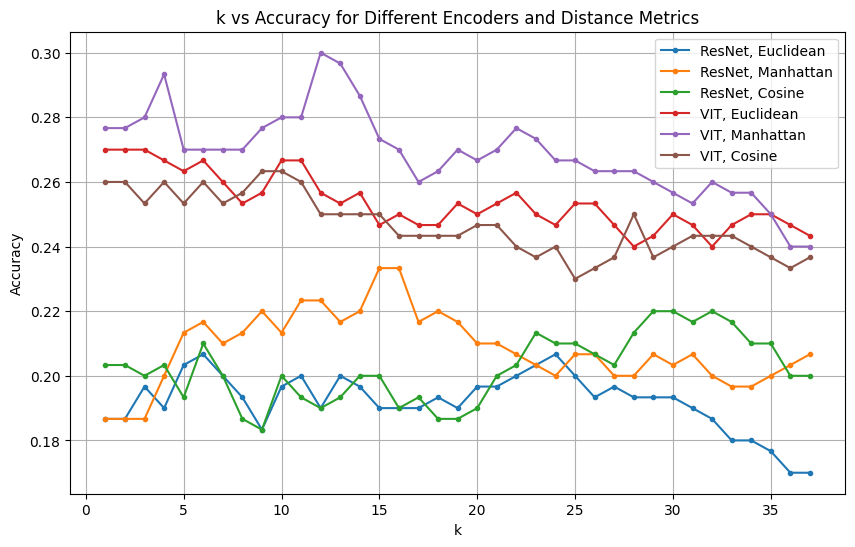

In [50]:
def plot_k_vs_accuracy(params, title):
    k_values = [param['k'] for param in params]
    accuracy_values = [param['accuracy'] for param in params]
    plt.plot(k_values, accuracy_values, marker='.', label=title)
    
plt.figure(figsize=(10, 6))

plot_k_vs_accuracy(resnet_euc, 'ResNet, Euclidean')
plot_k_vs_accuracy(resnet_man, 'ResNet, Manhattan')
plot_k_vs_accuracy(resnet_cosine, 'ResNet, Cosine')
plot_k_vs_accuracy(vit_euc, 'VIT, Euclidean')
plot_k_vs_accuracy(vit_man, 'VIT, Manhattan')
plot_k_vs_accuracy(vit_cosine, 'VIT, Cosine')

plt.title('k vs Accuracy for Different Encoders and Distance Metrics')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

### Optimization

Since the initial model is already vectorized, meaning that calculations are performed for the entire vector simultaneously, it leads to a substantial reduction in execution time compared to the conventional approach of iteratively looping through the vector to calculate distances.

Using the inbuilt KNN model to compare results with the above model. The inbuilt KNN model is provided by sklearn.

In [51]:
sklearn_knn = KNeighborsClassifier(n_neighbors=12, metric="manhattan")

In [52]:
x_train = knn.x_train
y_train = knn.y_train

start_knn = time.time()
for x in knn.x_val:
    knn.predict(x, x_train, y_train)
end_knn = time.time()

inference_time_knn = end_knn - start_knn

In [53]:
one_hot_encoder = OneHotEncoder(sparse_output=False)
y_train_knn = one_hot_encoder.fit_transform(knn.y_train.values.reshape(-1, 1))
y_val_knn = one_hot_encoder.fit_transform(knn.y_val.values.reshape(-1, 1))
    
x_train_knn = []
for x in knn.x_train:
    x_train_knn.append(x[0])

x_val_knn = []
for x in knn.x_val:
    x_val_knn.append(x[0])

In [54]:
start_sklearn = time.time()
sklearn_knn.fit(x_train_knn, y_train_knn)
sklearn_knn.predict(x_val_knn)
end_sklearn = time.time()

inference_time_sklearn = end_sklearn - start_sklearn

### Inference time comparison between best KNN and Sklearn KNN

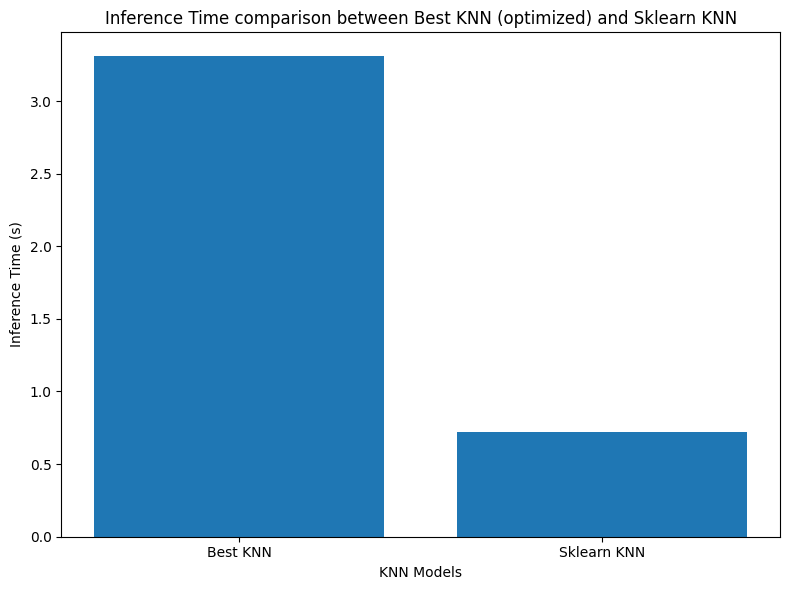

In [55]:
models = ['Best KNN', 'Sklearn KNN']
inference_time = [inference_time_knn, inference_time_sklearn]

plt.figure(figsize=(8, 6))
plt.bar(models, inference_time)
plt.xlabel('KNN Models')
plt.ylabel('Inference Time (s)')
plt.title('Inference Time comparison between Best KNN (optimized) and Sklearn KNN')
plt.tight_layout()
plt.show()

In [56]:
current_split = 0.05
end_split = 0.5
step = 0.05

knn_times = []
sklearn_knn_times = []
split_ratio = []

while current_split <= end_split:
    split_ratio.append(current_split)
    knn.split = current_split
    knn.set_data()
    
    knn_start_time = time.time()
    for x in knn.x_val:
        knn.predict(x, knn.x_train, knn.y_train)
    knn_end_time = time.time()
    knn_times.append(knn_end_time - knn_start_time)
    
    y_train_knn = one_hot_encoder.fit_transform(knn.y_train.values.reshape(-1, 1))
    y_val_knn = one_hot_encoder.fit_transform(knn.y_val.values.reshape(-1, 1))
    
    x_train_knn = []
    for x in knn.x_train:
        x_train_knn.append(x[0])

    x_val_knn = []
    for x in knn.x_val:
        x_val_knn.append(x[0])
        
    start_sklearn_knn = time.time()
    sklearn_knn.fit(x_train_knn, y_train_knn)
    sklearn_knn.predict(x_val_knn)
    end_sklearn_knn = time.time()
    sklearn_knn_times.append(end_sklearn_knn - start_sklearn_knn)
    
    current_split += step

### Inference Time vs. Train Dataset Size

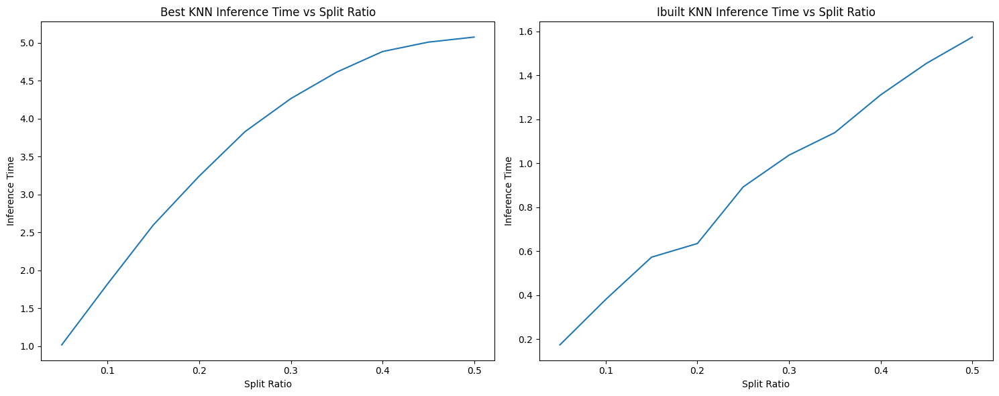

In [57]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

axes[0].plot(split_ratio, knn_times)
axes[0].set_xlabel('Split Ratio')
axes[0].set_ylabel('Inference Time')
axes[0].set_title('Best KNN Inference Time vs Split Ratio')

axes[1].plot(split_ratio, sklearn_knn_times)
axes[1].set_xlabel('Split Ratio')
axes[1].set_ylabel('Inference Time')
axes[1].set_title('Ibuilt KNN Inference Time vs Split Ratio')

plt.tight_layout()
plt.show()

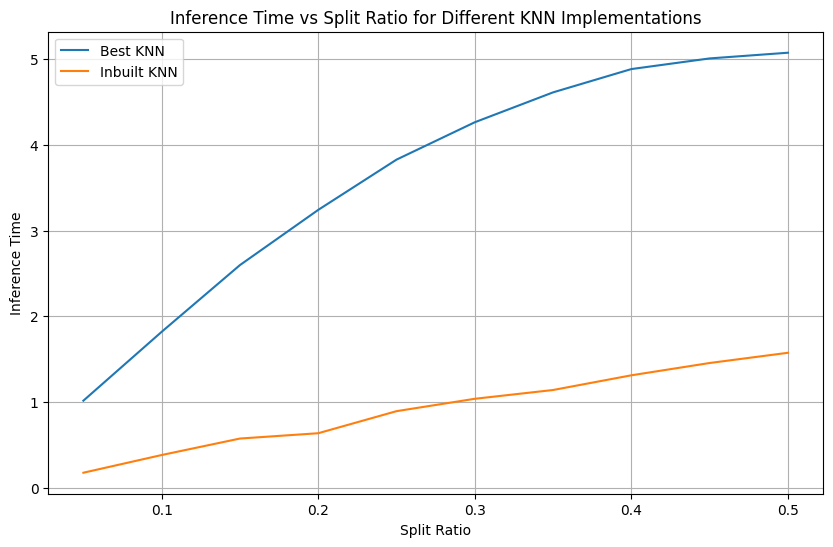

In [58]:
plt.figure(figsize=(10, 6))
plt.plot(split_ratio, knn_times, label='Best KNN')
plt.plot(split_ratio, sklearn_knn_times, label='Inbuilt KNN')
plt.xlabel('Split Ratio')
plt.ylabel('Inference Time')
plt.title('Inference Time vs Split Ratio for Different KNN Implementations')
plt.legend()
plt.grid(True)
plt.show()

# Part B - Decision Trees

In [59]:
data_df_dt = pd.read_csv('advertisement.csv')

In [60]:
data_df_dt.head()

,age,gender,income,education,married,children,city,occupation,purchase_amount,most bought item,labels
0,45,Male,61271.953359,Master,False,3,Lake Sheila,Doctor,87.697118,monitor,electronics clothing sports
1,24,Female,53229.101074,High School,False,1,Crystalburgh,Businessman,115.135586,lipstick,furniture beauty
2,45,Female,30066.046684,Bachelor,True,3,Margaretburgh,Engineer,101.694559,biscuits,clothing electronics food sports
3,19,Male,48950.246384,PhD,False,0,Williamshaven,Lawyer,97.964887,maggi,food
4,29,Female,44792.627094,Master,False,0,New Paul,Businessman,86.847281,carpet,home


In [61]:
data_df_dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               1000 non-null   int64  
 1   gender            1000 non-null   object 
 2   income            1000 non-null   float64
 3   education         1000 non-null   object 
 4   married           1000 non-null   bool   
 5   children          1000 non-null   int64  
 6   city              1000 non-null   object 
 7   occupation        1000 non-null   object 
 8   purchase_amount   1000 non-null   float64
 9   most bought item  1000 non-null   object 
 10  labels            1000 non-null   object 
dtypes: bool(1), float64(2), int64(2), object(6)
memory usage: 79.2+ KB


### Visualization

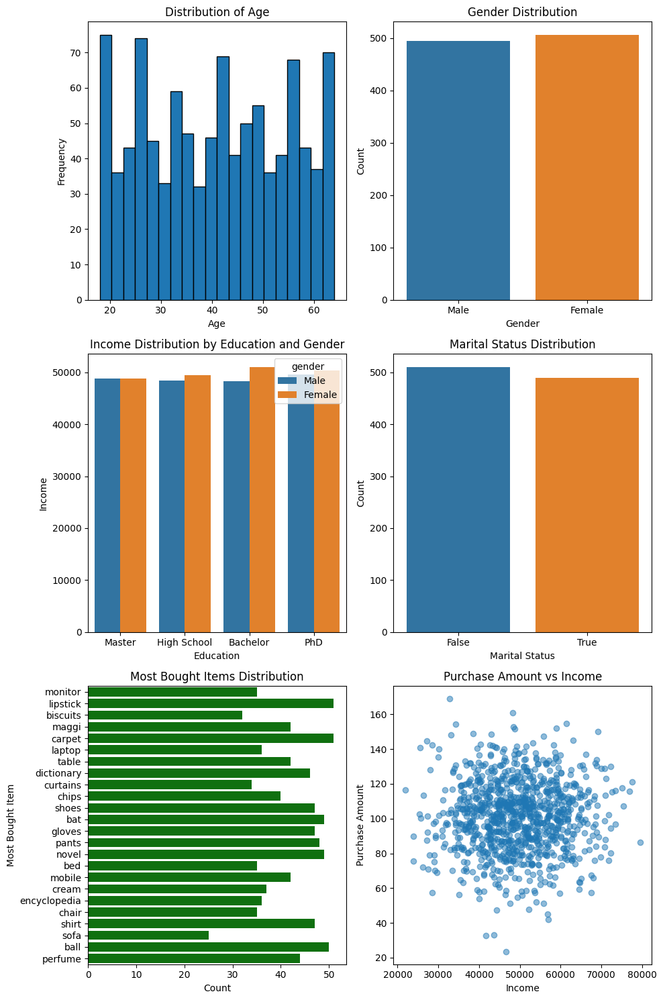

In [62]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 15))
plt.subplots_adjust(hspace=0.5)

# Distribution of Age
axes[0, 0].hist(data_df_dt['age'], bins=20, edgecolor='k')
axes[0, 0].set_xlabel('Age')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Distribution of Age')

# Gender Distribution
sns.countplot(data=data_df_dt, x='gender', ax=axes[0, 1])
axes[0, 1].set_xlabel('Gender')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Gender Distribution')

# Income Distribution by Education and Gender
sns.barplot(data=data_df_dt, x='education', y='income', hue='gender', errorbar=None, ax=axes[1, 0])
axes[1, 0].set_xlabel('Education')
axes[1, 0].set_ylabel('Income')
axes[1, 0].set_title('Income Distribution by Education and Gender')

# Marital Status Distribution
sns.countplot(data=data_df_dt, x='married', ax=axes[1, 1])
axes[1, 1].set_xlabel('Marital Status')
axes[1, 1].set_ylabel('Count')
axes[1, 1].set_title('Marital Status Distribution')

# Most Bought Items Distribution
sns.countplot(data=data_df_dt, y='most bought item', color='green', ax=axes[2, 0])
axes[2, 0].set_xlabel('Count')
axes[2, 0].set_ylabel('Most Bought Item')
axes[2, 0].set_title('Most Bought Items Distribution')

# Purchase Amount vs Income
axes[2, 1].scatter(data_df_dt['income'], data_df_dt['purchase_amount'], alpha=0.5)
axes[2, 1].set_xlabel('Income')
axes[2, 1].set_ylabel('Purchase Amount')
axes[2, 1].set_title('Purchase Amount vs Income')

plt.tight_layout()
plt.show()

### Preprocessing

### One Hot Encoding

In [63]:
categorical_columns = ["education", "city", "occupation", "most bought item"]
data_df_preprocess = pd.get_dummies(data_df_dt, columns=categorical_columns)

### Binary Encoding

In [64]:
data_df_preprocess["gender"] = data_df_dt["gender"].apply(lambda x: 1 if x == "Male" else 0)
data_df_preprocess["married"] = data_df_dt["married"].astype(int)

## Powerset Decision Tree

In [65]:
class DecisionTreePowerSet:
    def __init__(self, max_depth=None, max_features=None, criterion="entropy"):
        self.max_depth = max_depth
        self.max_features = max_features
        self.criterion = criterion
        self.model = None
        self.x_train = None
        self.y_train = None
        self.x_test = None
        self.y_test = None
        self.set_data()

    def set_data(self):
        x = data_df_preprocess.drop(columns=["labels"]).values
        y = mlb.fit_transform(data_df_preprocess["labels"].str.split())
        
        self.x_train, self.x_test, self.y_train, self.y_test = train_test_split(x, y, test_size=0.2, random_state=42, shuffle=True)
        self.model = LabelPowerset(classifier=DecisionTreeClassifier(
                max_depth=self.max_depth,
                max_features=self.max_features,
                criterion=self.criterion))
        
    def fit(self, x_train, y_train):
        self.model.fit(x_train, y_train)
        
    def predict(self, x):
        predictions = self.model.predict(x)
        return predictions.toarray()
    
    def evaluate_metrics(self, x_test, y_test):
        predictions = self.predict(x_test)
        hamming_loss_score = hamming_loss(y_test, predictions)
        recall = recall_score(y_test, predictions, average='micro', zero_division=1)
        precision = precision_score(y_test, predictions, average='micro', zero_division=1)
        f1_micro = f1_score(y_test, predictions, average='micro')
        f1_macro = f1_score(y_test, predictions, average='macro')
        f1_weighted = f1_score(y_test, predictions, average='weighted')
        accuracy = 1 - hamming_loss_score
        
        return accuracy, precision, recall, f1_micro, f1_macro, f1_weighted

In [66]:
dt = DecisionTreePowerSet(max_depth=30, max_features=11, criterion="entropy")
dt.fit(dt.x_train, dt.y_train)
accuracy, precision, recall, f1_micro, f1_macro, f1_weighted = dt.evaluate_metrics(dt.x_test, dt.y_test)

In [67]:
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Micro: ", f1_micro)
print("F1 Macro: ", f1_macro)
print("F1 Weighted: ", f1_macro)

Accuracy:  0.6012500000000001
Precision:  0.3796095444685466
Recall:  0.33206831119544594
F1 Micro:  0.354251012145749
F1 Macro:  0.3500752698713331
F1 Weighted:  0.3500752698713331


## Multioutput Decision Tree

In [68]:
class DecisionTreeMultiOutput:
    def __init__(self, max_depth=5, max_features=7, criterion="entropy"):
        self.max_depth = max_depth
        self.max_features = max_features
        self.criterion = criterion
        self.model = None
        self.x_train = None
        self.y_train = None
        self.x_test = None
        self.y_test = None
        self.set_data()
        
    def set_data(self):
        x = data_df_preprocess.drop(columns=["labels"]).values
        y = mlb.fit_transform(data_df_preprocess["labels"].str.split())
        
        self.x_train, self.x_test, self.y_train, self.y_test = train_test_split(x, y, test_size=0.2, random_state=42, shuffle=True)
        self.model = MultiOutputClassifier(DecisionTreeClassifier(
                max_depth=self.max_depth,
                max_features=self.max_features,
                criterion=self.criterion
            ))
    
    def fit(self, x_train, y_train):
        self.model.fit(x_train, y_train)
        
    def predict(self, x):
        predictions = self.model.predict(x)
        return predictions
    
    def evaluate_metrics(self, x_test, y_test):
        predictions = self.predict(x_test)
        hamming_loss_score = hamming_loss(y_test, predictions)
        recall = recall_score(y_test, predictions, average='micro', zero_division=1)
        precision = precision_score(y_test, predictions, average='micro', zero_division=1)
        f1_micro = f1_score(y_test, predictions, average='micro')
        f1_macro = f1_score(y_test, predictions, average='macro')
        f1_weighted = f1_score(y_test, predictions, average='weighted')
        accuracy = 1 - hamming_loss_score
        
        return accuracy, precision, recall, f1_micro, f1_macro, f1_weighted

In [69]:
dt_mo = DecisionTreeMultiOutput(max_depth=30, max_features=11, criterion="entropy")
dt_mo.fit(dt_mo.x_train, dt_mo.y_train)
accuracy, precision, recall, f1_micro, f1_macro, f1_weighted = dt_mo.evaluate_metrics(dt_mo.x_test, dt_mo.y_test)

In [70]:
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Micro: ", f1_micro)
print("F1 Macro: ", f1_macro)
print("F1 Weighted: ", f1_weighted)

Accuracy:  0.693125
Precision:  0.6836734693877551
Recall:  0.127134724857685
F1 Micro:  0.21439999999999998
F1 Macro:  0.20530322183805422
F1 Weighted:  0.20405077905728744


### Metrics

In [71]:
criterion = ["gini", "entropy"]
max_depth = [3,5,10,20,30]
max_features = [3,5,7,9,11]

In [72]:
metrics_powerset = dict()
metrics_multioutput = dict()

for cri in criterion:
    for depth in max_depth:
        for feature in max_features:
            dt_powerset = DecisionTreePowerSet(max_depth=depth, max_features=feature, criterion=cri)
            dt_multioutput = DecisionTreeMultiOutput(max_depth=depth, max_features=feature, criterion=cri)
            
            dt_powerset.fit(dt_powerset.x_train, dt_powerset.y_train)
            dt_multioutput.fit(dt_multioutput.x_train, dt_multioutput.y_train)
            
            predictions_powerset = dt_powerset.predict(dt_powerset.x_test)
            predictions_multioutput = dt_multioutput.predict(dt_multioutput.x_test)
            
            accuracy_power, precision_power, recall_power, f1_micro_power, f1_macro_power, f1_weighted_power = dt_powerset.evaluate_metrics(dt_powerset.x_test, dt_powerset.y_test)
            accuracy_multi, precision_multi, recall_multi, f1_micro_multi, f1_macro_multi, f1_weighted_multi = dt_multioutput.evaluate_metrics(dt_multioutput.x_test, dt_multioutput.y_test)
            
            metrics_powerset[(cri, depth, feature)] = {"accuracy": accuracy_power, "precision": precision_power, "recall": recall_power, "f1_micro": f1_micro_power, "f1_macro": f1_macro_power, "f1_weighted": f1_weighted_power, "predictions": predictions_powerset, "true_values": dt_powerset.y_test}
            metrics_multioutput[(cri, depth, feature)] = {"accuracy": accuracy_multi, "precision": precision_multi, "recall": recall_multi, "f1_micro": f1_micro_multi, "f1_macro": f1_macro_multi, "f1_weighted": f1_weighted_multi, "predictions": predictions_multioutput, "true_values": dt_multioutput.y_test}

In [73]:
metrics_powerset = dict(sorted(metrics_powerset.items(), key=lambda x: x[1]["accuracy"], reverse=True))
metrics_multioutput = dict(sorted(metrics_multioutput.items(), key=lambda x: x[1]["accuracy"], reverse=True))

def tabulate_metrics(metrics_dict):
    table_data = []

    for params, metrics in metrics_dict.items():
        cri, depth, feature = params
        accuracy = metrics["accuracy"]
        recall = metrics["recall"]
        precision = metrics["precision"]
        f1_micro = metrics["f1_micro"]
        f1_macro = metrics["f1_macro"]
        f1_weighted = metrics["f1_weighted"]

        table_data.append([cri, depth, feature, accuracy, precision, recall, f1_micro, f1_macro])

    headers = ["Criterion", "Max Depth", "Max Features", "Accuracy", "Precision","Recall", "F1 Micro", "F1 Macro", "F1 Weighted"]
    return tabulate(table_data, headers=headers, tablefmt="grid")

### Metrics for PowerSet

In [74]:
print(tabulate_metrics(metrics_powerset))

+-------------+-------------+----------------+------------+-------------+----------+------------+------------+
| Criterion   |   Max Depth |   Max Features |   Accuracy |   Precision |   Recall |   F1 Micro |   F1 Macro |
+=============+=============+================+============+=============+==========+============+============+
| gini        |          30 |              7 |   0.675    |    0.513514 | 0.252372 |   0.338422 |  0.276919  |
+-------------+-------------+----------------+------------+-------------+----------+------------+------------+
| entropy     |          10 |              7 |   0.6525   |    0.435556 | 0.185958 |   0.260638 |  0.173041  |
+-------------+-------------+----------------+------------+-------------+----------+------------+------------+
| gini        |          30 |             11 |   0.650625 |    0.449367 | 0.26945  |   0.336892 |  0.280853  |
+-------------+-------------+----------------+------------+-------------+----------+------------+------------+
|

### Metrics for MultiOutput

In [75]:
print(tabulate_metrics(metrics_multioutput))

+-------------+-------------+----------------+------------+-------------+------------+------------+------------+
| Criterion   |   Max Depth |   Max Features |   Accuracy |   Precision |     Recall |   F1 Micro |   F1 Macro |
+=============+=============+================+============+=============+============+============+============+
| gini        |          20 |             11 |   0.704375 |    0.846154 | 0.125237   | 0.218182   | 0.205836   |
+-------------+-------------+----------------+------------+-------------+------------+------------+------------+
| entropy     |          30 |             11 |   0.701875 |    0.804878 | 0.125237   | 0.216749   | 0.203259   |
+-------------+-------------+----------------+------------+-------------+------------+------------+------------+
| entropy     |          10 |              9 |   0.694375 |    0.895833 | 0.0815939  | 0.149565   | 0.141423   |
+-------------+-------------+----------------+------------+-------------+------------+----------

### Confusion Matrix - Powerset

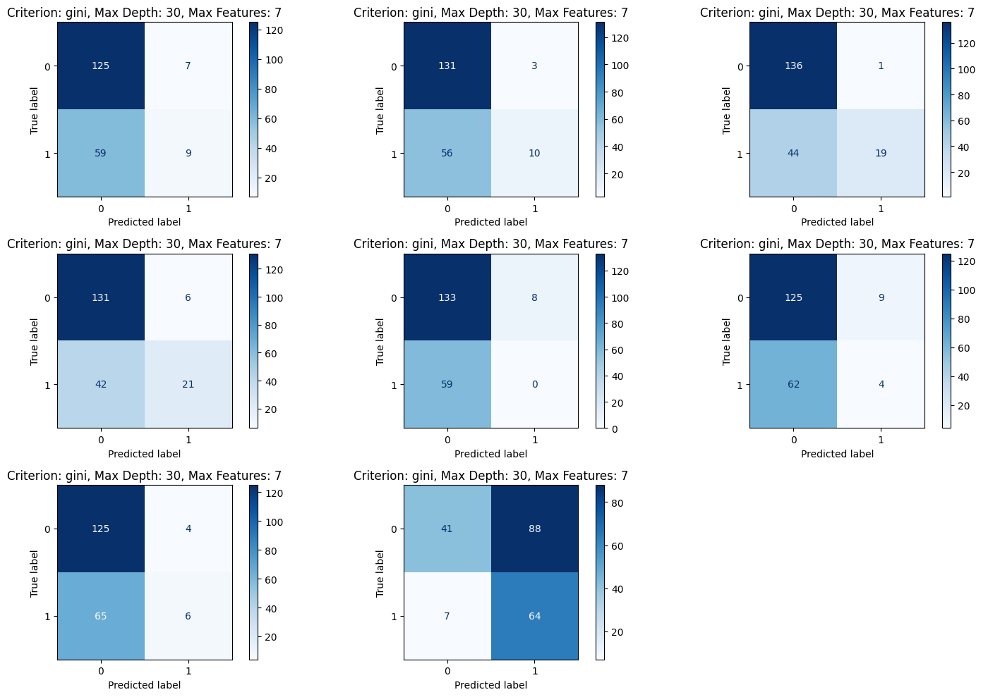

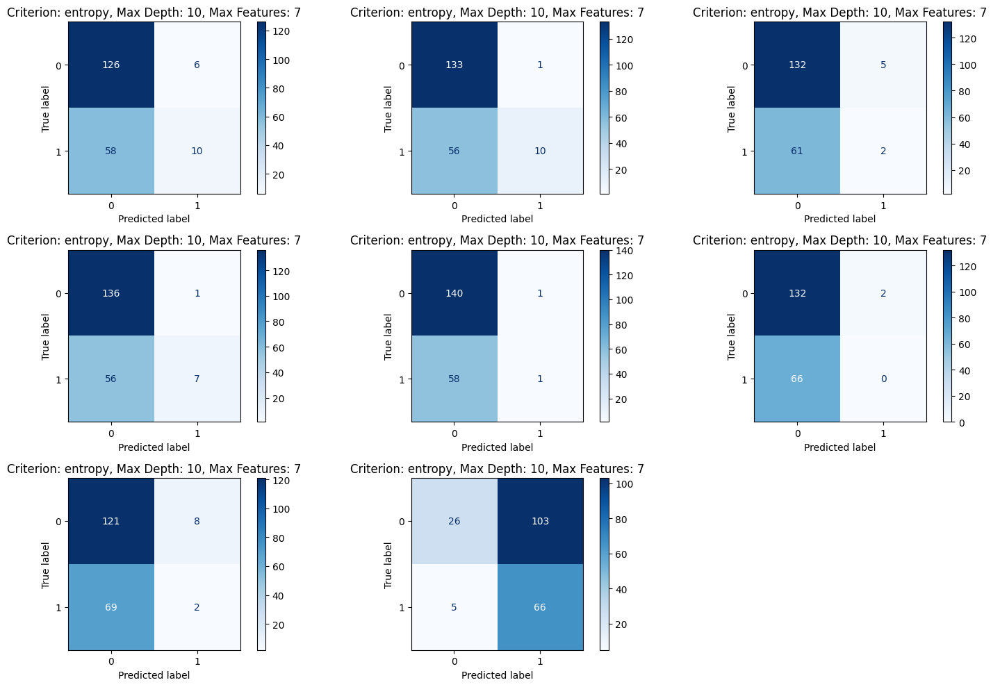

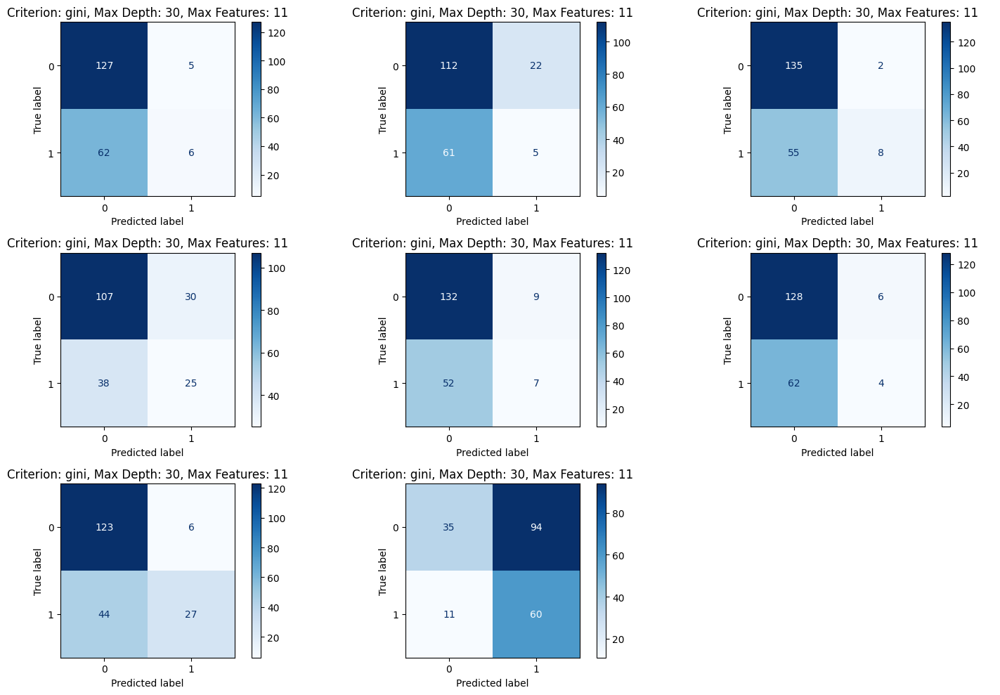

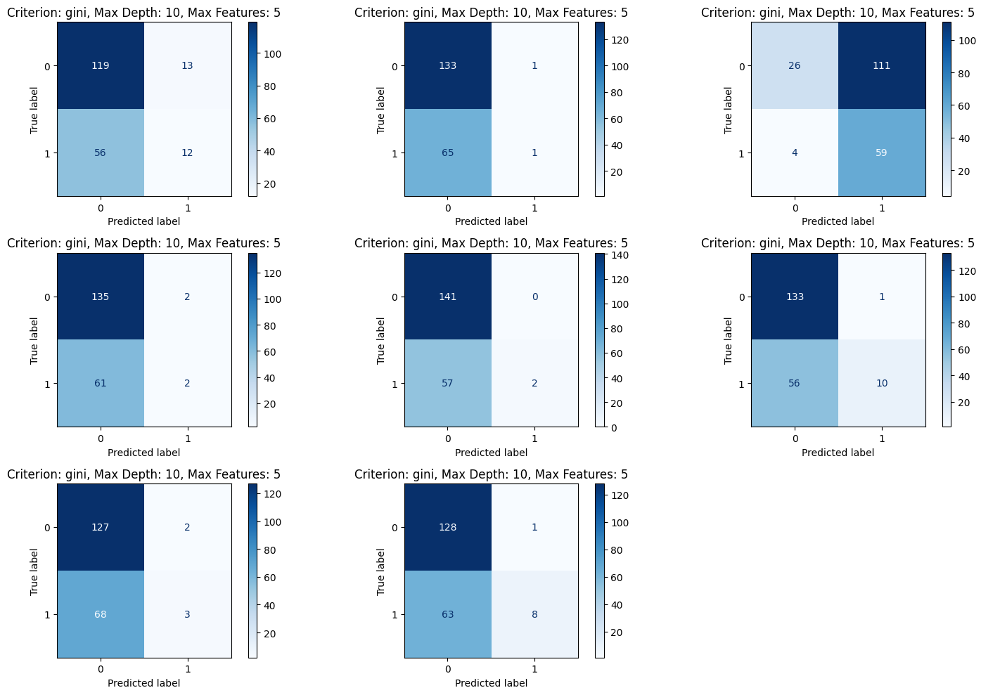

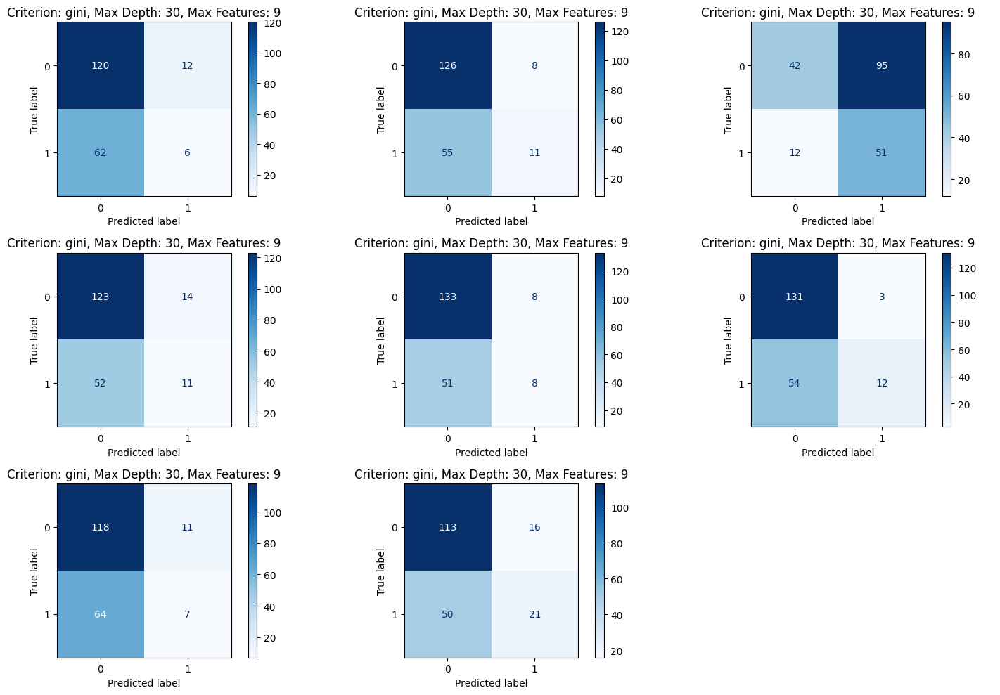

...

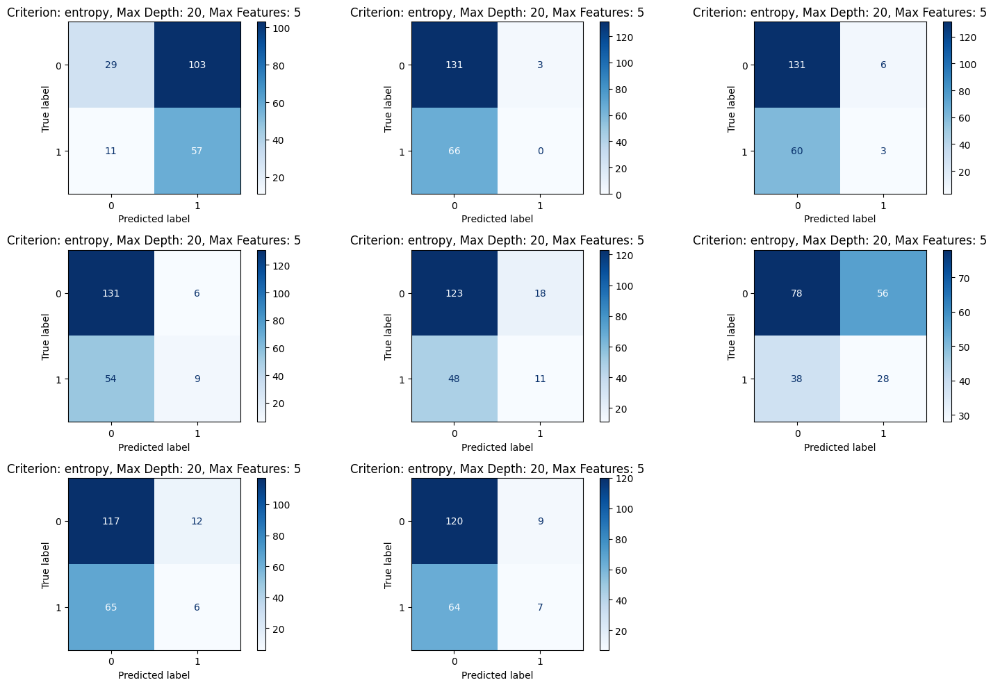

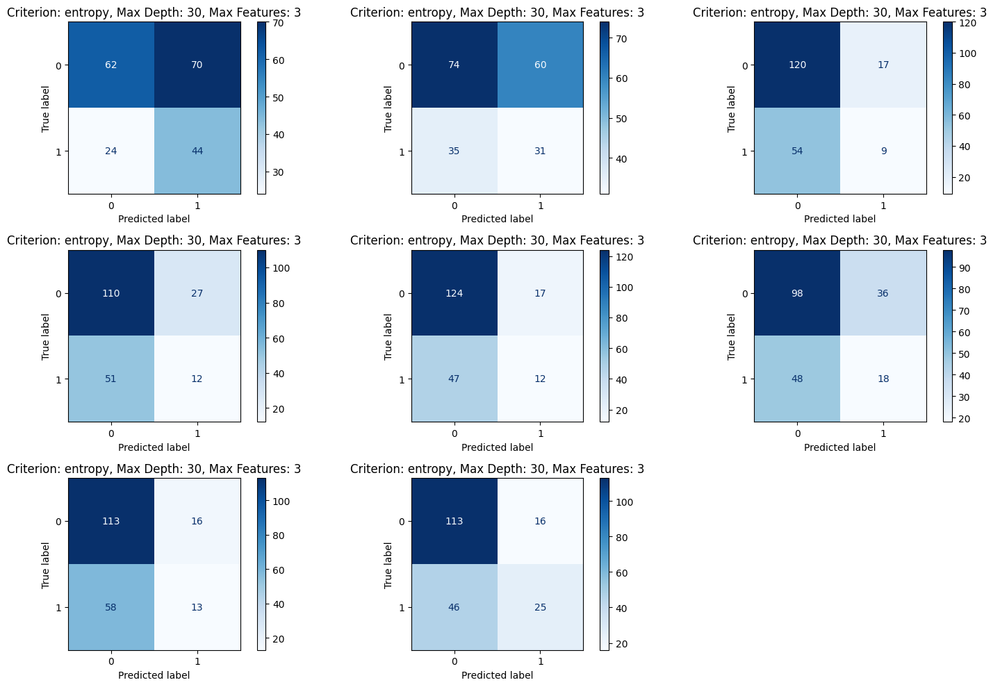

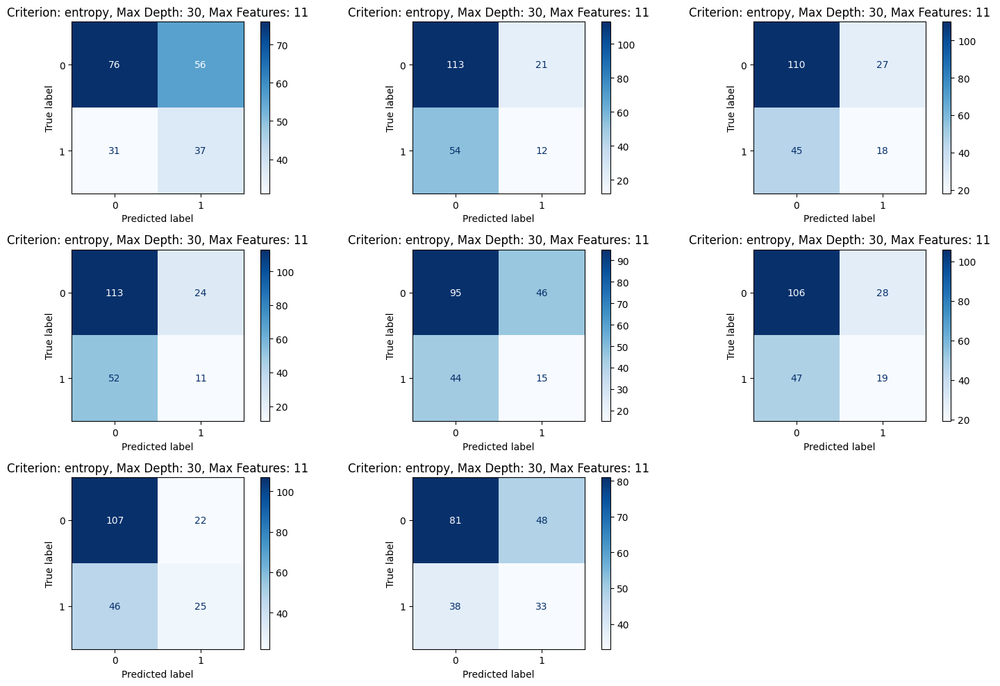

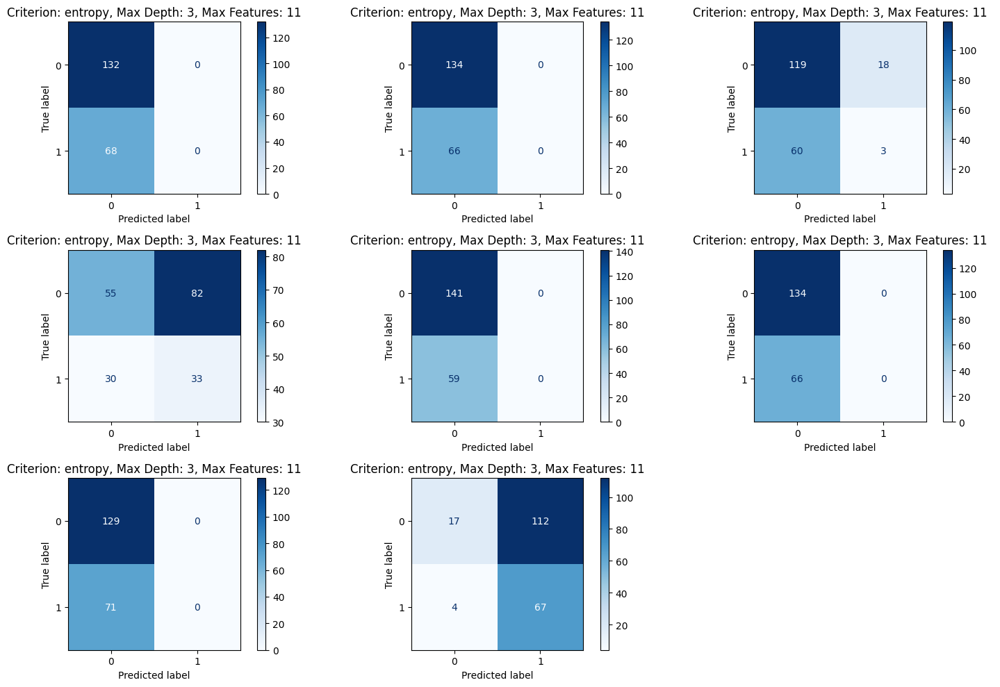

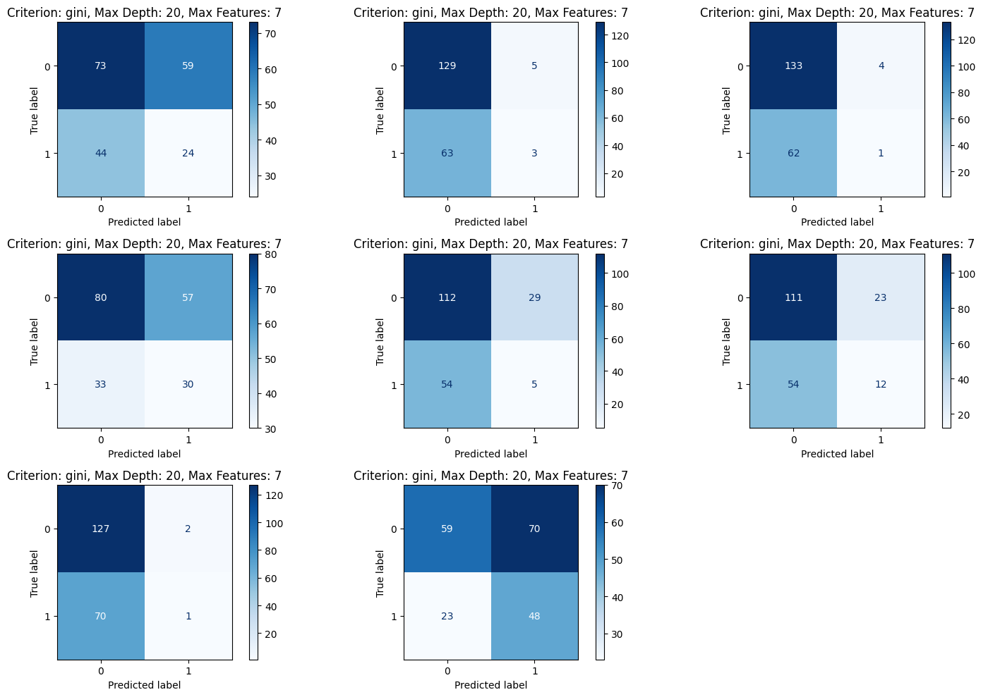

In [76]:
# took reference from GPT
for parameters, metrics in metrics_powerset.items():
    cri, depth, feature = parameters
    confusion_matrix_array = multilabel_confusion_matrix(metrics["true_values"], metrics["predictions"])
    
    num_matrices = len(confusion_matrix_array)
    num_cols = 3
    num_rows = (num_matrices + 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for matrix, ax in zip(confusion_matrix_array, axes.flatten()):
        disp = ConfusionMatrixDisplay(matrix)
        disp.plot(cmap=plt.cm.Blues, ax=ax)
        ax.set_title(f"Criterion: {cri}, Max Depth: {depth}, Max Features: {feature}")

    # remove empty plots
    for i in range(len(confusion_matrix_array), num_rows * num_cols):
        axes.flatten()[i].axis('off')

    plt.tight_layout()
    plt.show()

### Confusion Matrix - Multioutput

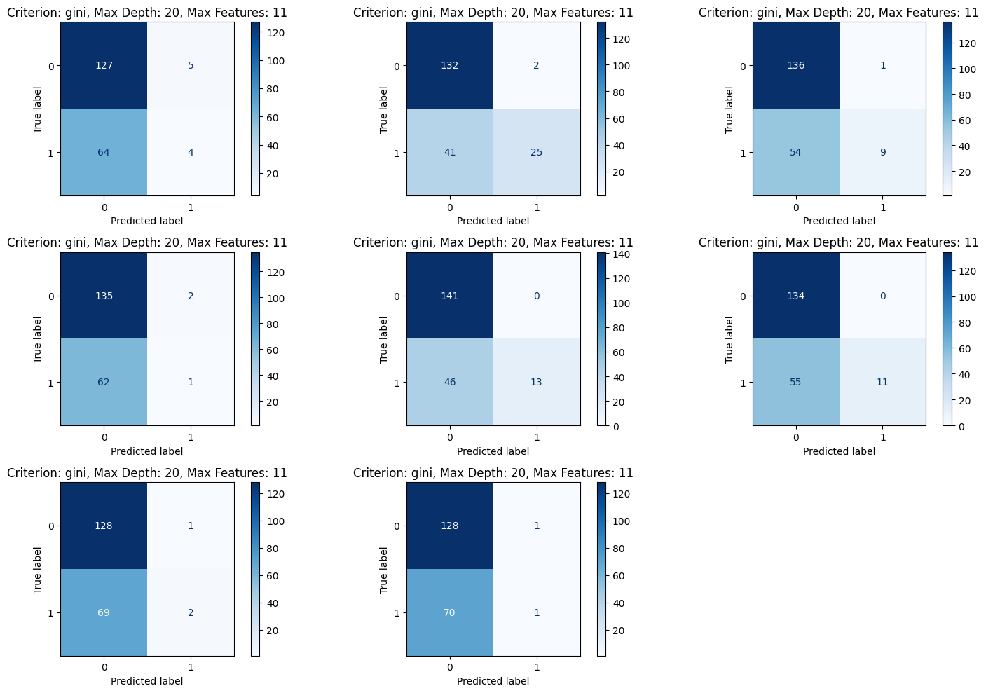

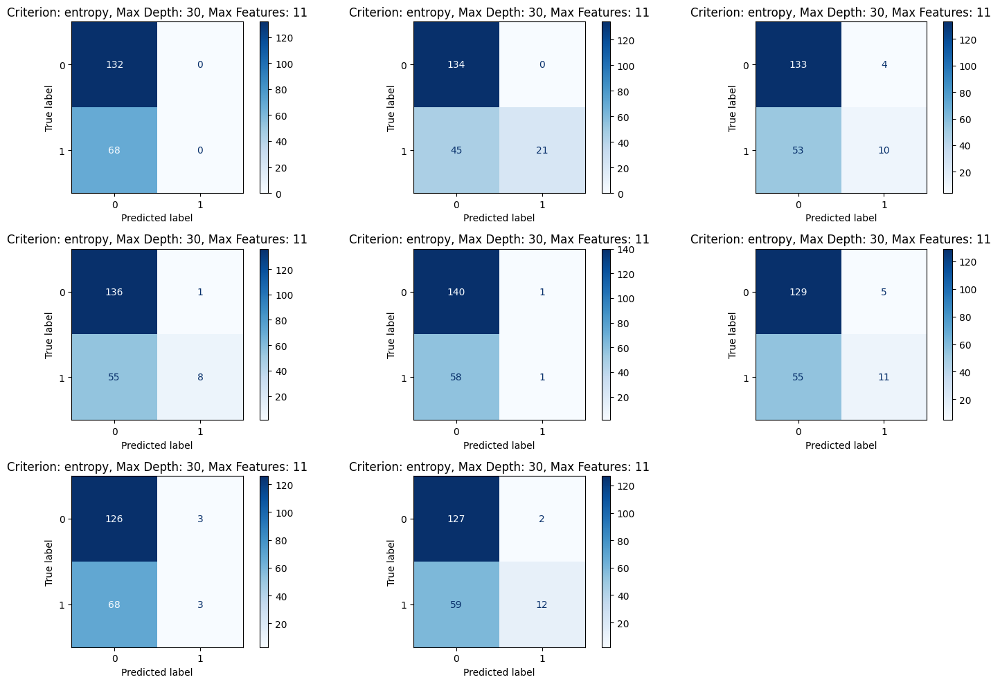

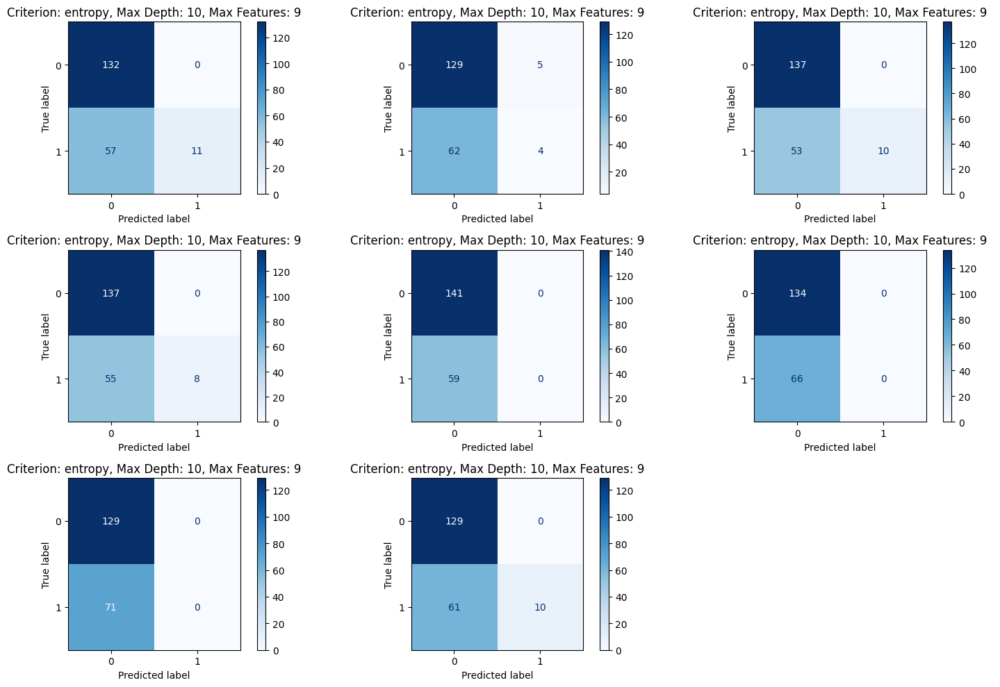

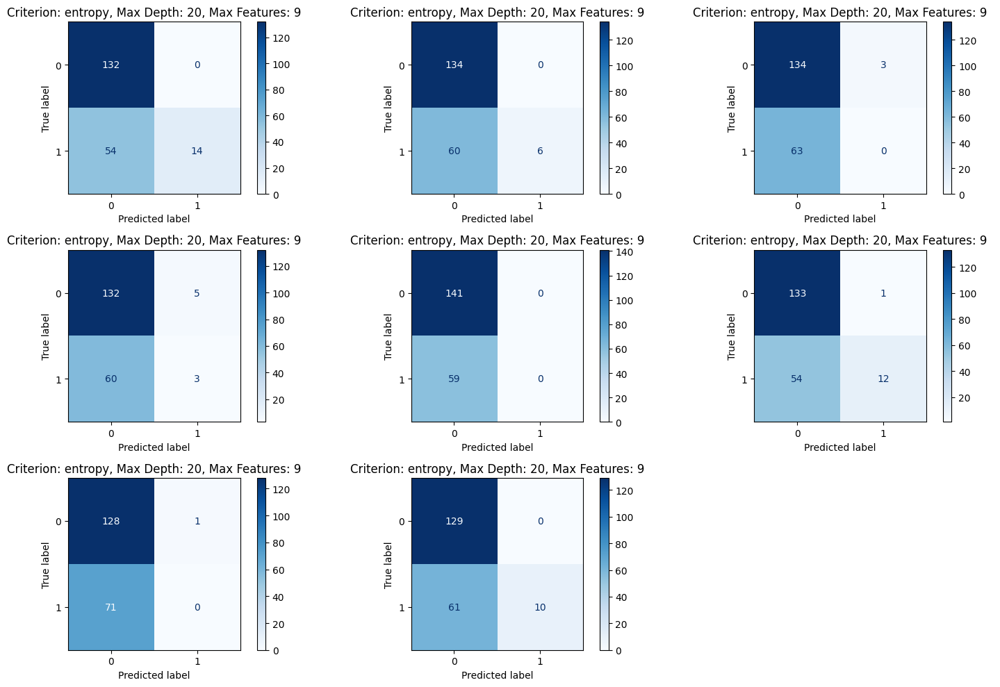

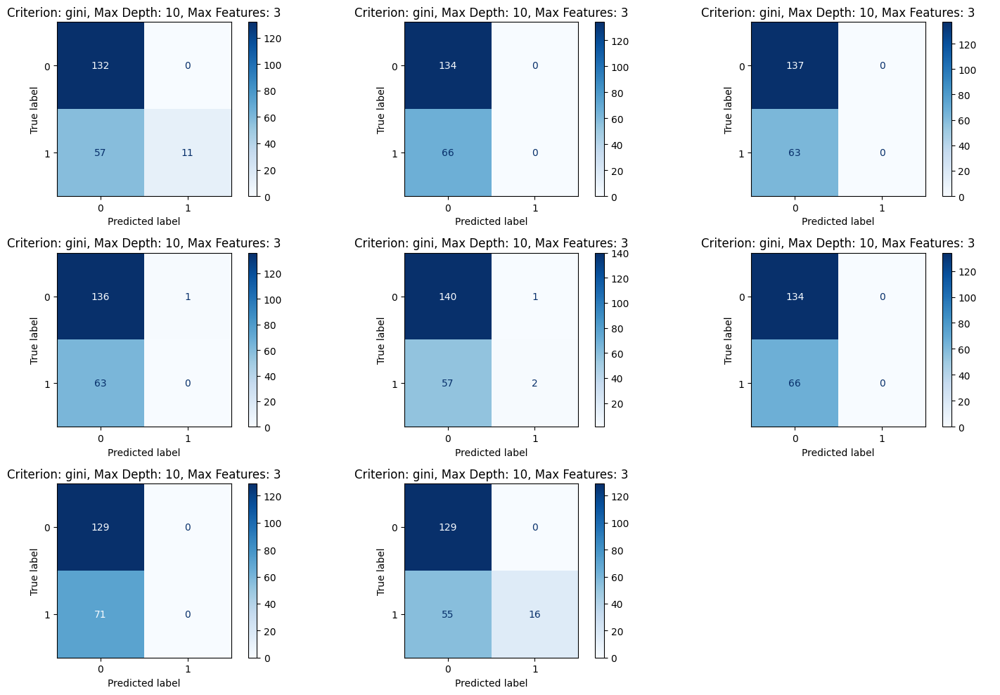

...

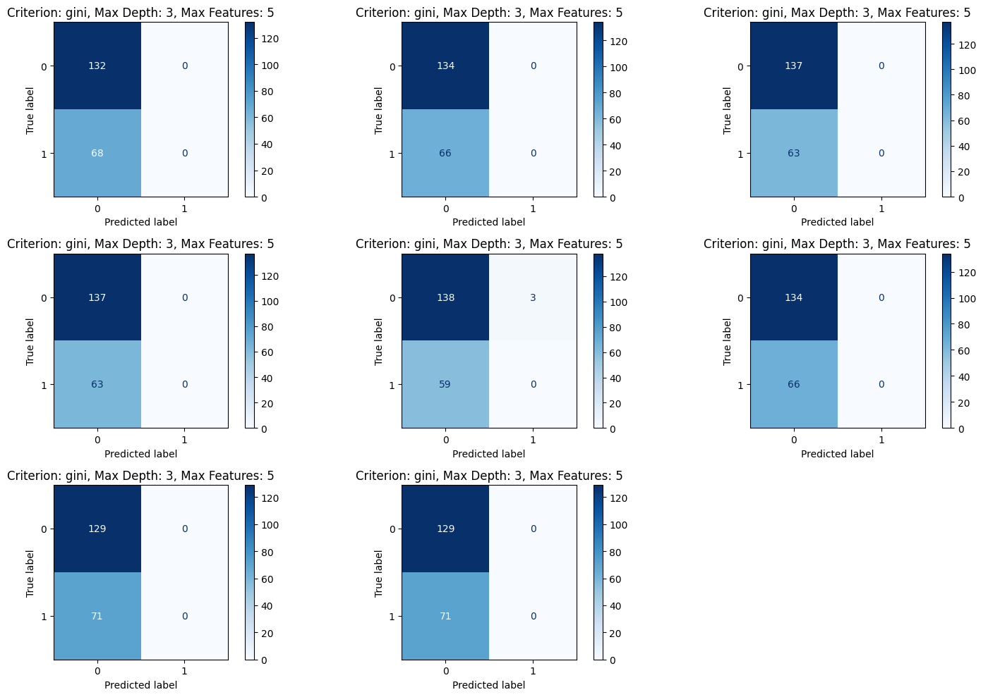

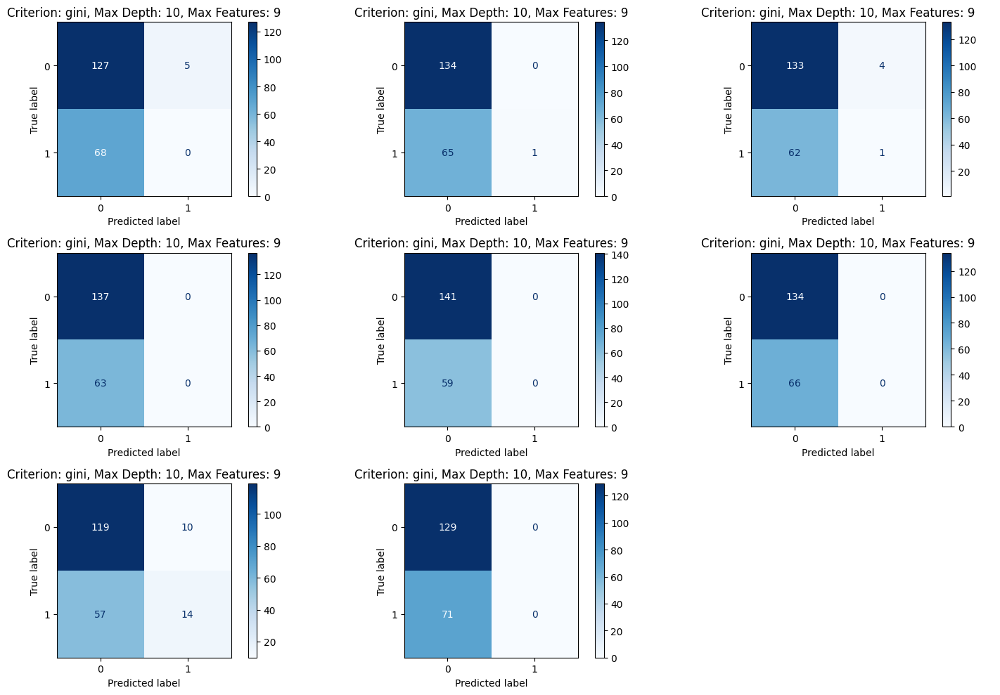

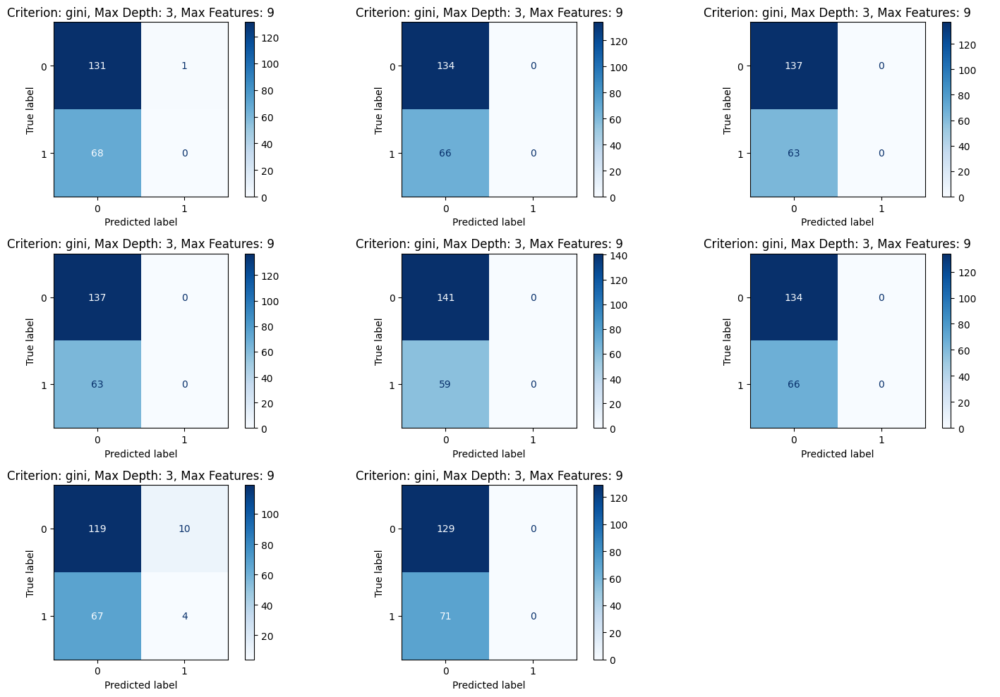

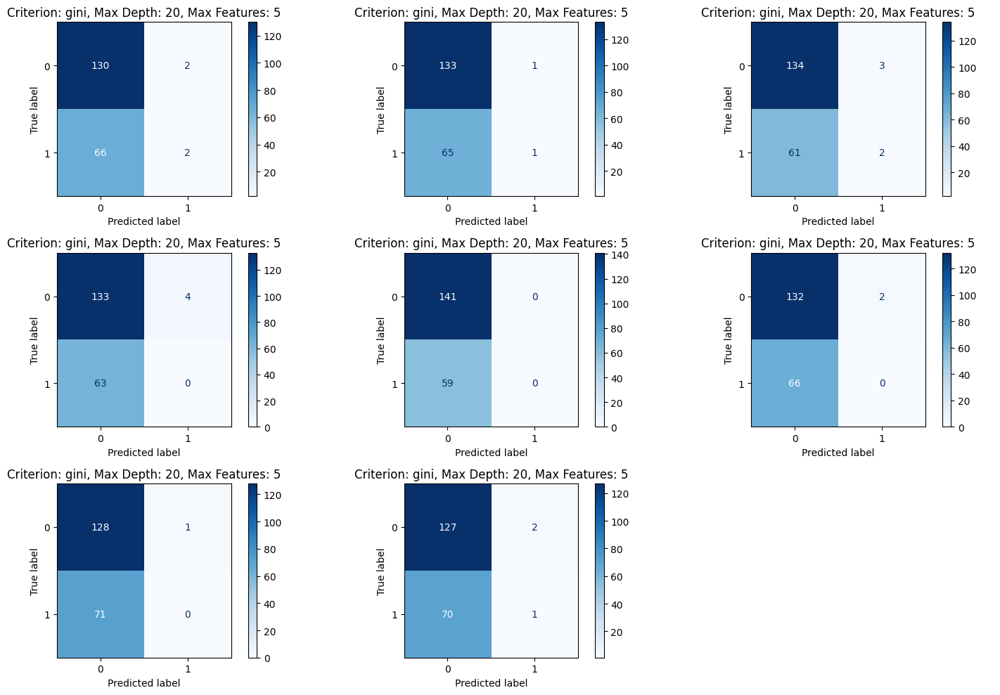

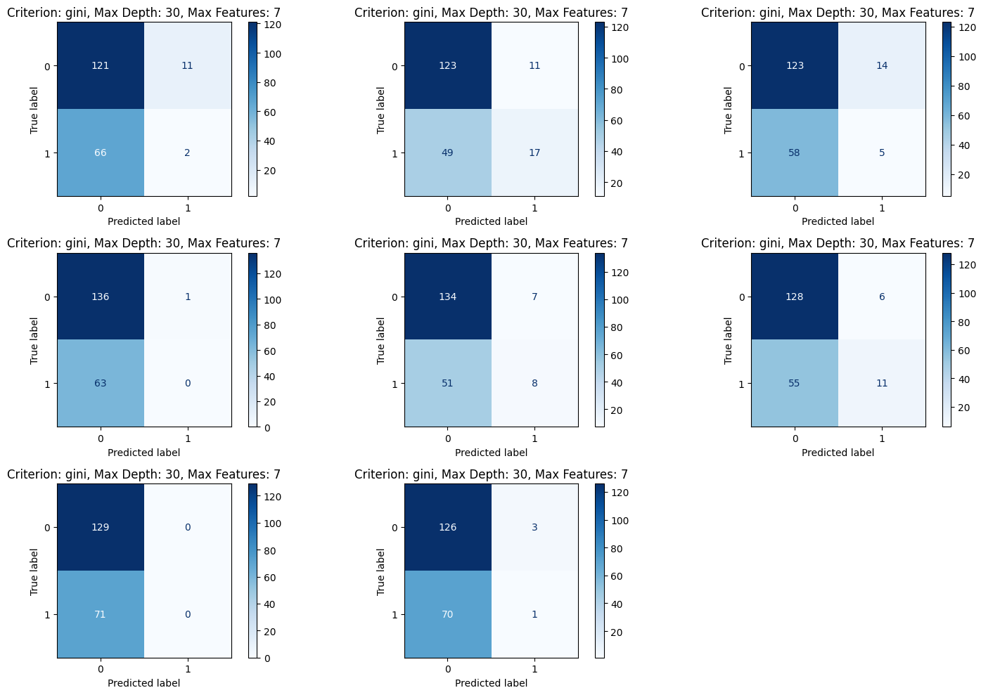

In [77]:
# took reference from GPT
for parameters, metrics in metrics_multioutput.items():
    cri, depth, feature = parameters
    confusion_matrix_array = multilabel_confusion_matrix(metrics["true_values"], metrics["predictions"])
    
    num_matrices = len(confusion_matrix_array)
    num_cols = 3
    num_rows = (num_matrices + 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for matrix, ax in zip(confusion_matrix_array, axes.flatten()):
        disp = ConfusionMatrixDisplay(matrix)
        disp.plot(cmap=plt.cm.Blues, ax=ax)
        ax.set_title(f"Criterion: {cri}, Max Depth: {depth}, Max Features: {feature}")

    # remove empty plots
    for i in range(len(confusion_matrix_array), num_rows * num_cols):
        axes.flatten()[i].axis('off')

    plt.tight_layout()
    plt.show()

### Best Performing Models - F1 Score (Micro)

In [78]:
top_powerset_micro = []
for params, metrics in metrics_powerset.items():
    f1_micro = metrics["f1_micro"]
    top_powerset_micro.append((params, f1_micro))
top_powerset_micro.sort(key=lambda x: x[1], reverse=True)
top_powerset_micro = top_powerset_micro[:3]

top_multioutput_micro = []
for params, metrics in metrics_multioutput.items():
    f1_micro = metrics["f1_micro"]
    top_multioutput_micro.append((params, f1_micro))
top_multioutput_micro.sort(key=lambda x: x[1], reverse=True)
top_multioutput_micro = top_multioutput_micro[:3]

In [79]:
def best_models_micro(top_hyperparams):
    table_data = []
    for params, f1_micro in top_hyperparams:
        cri, depth, feature = params
        table_data.append([cri, depth, feature, f1_micro])
    return table_data

In [80]:
headers = ["Criterion", "Max Depth", "Max Features", "F1 Score"]

powerset_top_models_micro = best_models_micro(top_powerset_micro)
multioutput_top_models_micro = best_models_micro(top_multioutput_micro)

### Top 3 performing models - Powerset (F1 Micro)

In [81]:
powerset_micro = tabulate(powerset_top_models_micro, headers=headers, tablefmt="grid")
print(powerset_micro)

+-------------+-------------+----------------+------------+
| Criterion   |   Max Depth |   Max Features |   F1 Score |
+=============+=============+================+============+
| entropy     |          30 |             11 |   0.350877 |
+-------------+-------------+----------------+------------+
| entropy     |          30 |              3 |   0.345263 |
+-------------+-------------+----------------+------------+
| gini        |          30 |              7 |   0.338422 |
+-------------+-------------+----------------+------------+


### Top 3 performing models - Multioutput (F1 Micro)

In [82]:
multioutput_micro = tabulate(multioutput_top_models_micro, headers=headers, tablefmt="grid")
print(multioutput_micro)

+-------------+-------------+----------------+------------+
| Criterion   |   Max Depth |   Max Features |   F1 Score |
+=============+=============+================+============+
| gini        |          20 |             11 |   0.218182 |
+-------------+-------------+----------------+------------+
| entropy     |          30 |             11 |   0.216749 |
+-------------+-------------+----------------+------------+
| gini        |          30 |             11 |   0.206154 |
+-------------+-------------+----------------+------------+


### K-Fold Validation - Powerset (F1 Micro)

In [83]:
criterion = powerset_top_models_micro[0][0]
max_depth = powerset_top_models_micro[0][1]
max_features = powerset_top_models_micro[0][2]

dt_powerset_kfold = DecisionTreePowerSet(criterion=criterion, max_depth=max_depth, max_features=max_features)

x = dt_powerset_kfold.x_train
y = dt_powerset_kfold.y_train
k = 5

k_fold_validation = KFold(n_splits=k, shuffle=True, random_state=42)

In [84]:
accuracy_powerset = []
recall_powerset = []
f1_micro_powerset = []
precision_powerset = []
recall_powerset = []
f1_macro_powerset = []
f1_weighted_powerset = []

for train_index, val_index in k_fold_validation.split(x):
    x_train, x_val = x[train_index], x[val_index]
    y_train, y_val = y[train_index], y[val_index]
    
    dt_powerset_kfold.fit(x_train, y_train)
    accuracy, precision, recall, f1_micro, f1_macro, f1_weighted = dt_powerset_kfold.evaluate_metrics(x_val, y_val)
    
    accuracy_powerset.append(accuracy)
    precision_powerset.append(precision)
    recall_powerset.append(recall)
    f1_micro_powerset.append(f1_micro)
    f1_macro_powerset.append(f1_macro)
    f1_weighted_powerset.append(f1_weighted)

In [85]:
avg_accuracy_p = np.mean(accuracy_powerset)
avg_precision_p = np.mean(precision_powerset)
avg_recall_p = np.mean(recall_powerset)
avg_f1_micro_p = np.mean(f1_micro_powerset)
avg_f1_macro_p = np.mean(f1_macro_powerset)
avg_f1_weighted_p = np.mean(f1_weighted_powerset)

### Metrics Powerset for K-Fold

In [86]:
headers=["Metric", "Value"]

table_data = [
    ("Average Accuracy", avg_accuracy_p),
    ("Average Precision", avg_precision_p),
    ("Average Recall", avg_recall_p),
    ("Average F1 Micro", avg_f1_micro_p),
    ("Average F1 Macro", avg_f1_macro_p)
]

print(tabulate(table_data, headers=headers, tablefmt="grid"))

+-------------------+----------+
| Metric            |    Value |
+===================+==========+
| Average Accuracy  | 0.581719 |
+-------------------+----------+
| Average Precision | 0.389098 |
+-------------------+----------+
| Average Recall    | 0.333436 |
+-------------------+----------+
| Average F1 Micro  | 0.356456 |
+-------------------+----------+
| Average F1 Macro  | 0.349726 |
+-------------------+----------+


### K-Fold Validation - Multioutput (F1 Micro)

In [87]:
criterion = multioutput_top_models_micro[0][0]
max_depth = multioutput_top_models_micro[0][1]
max_features = multioutput_top_models_micro[0][2]

dt_multioutput_kfold = DecisionTreeMultiOutput(criterion=criterion, max_depth=max_depth, max_features=max_features)

x = dt_multioutput_kfold.x_train
y = dt_multioutput_kfold.y_train
k = 5

k_fold_validation = KFold(n_splits=k, shuffle=True, random_state=42)

In [88]:
accuracy_multioutput = []
recall_multioutput = []
f1_micro_multioutput = []
precision_multioutput = []
recall_multioutput = []
f1_macro_multioutput = []
f1_weighted_multioutput = []

for train_index, val_index in k_fold_validation.split(x):
    x_train, x_val = x[train_index], x[val_index]
    y_train, y_val = y[train_index], y[val_index]
    
    dt_multioutput_kfold.fit(x_train, y_train)
    accuracy, precision, recall, f1_micro, f1_macro, f1_weighted = dt_multioutput_kfold.evaluate_metrics(x_val, y_val)
    
    accuracy_multioutput.append(accuracy)
    precision_multioutput.append(precision)
    recall_multioutput.append(recall)
    f1_micro_multioutput.append(f1_micro)
    f1_macro_multioutput.append(f1_macro)
    f1_weighted_multioutput.append(f1_weighted)

In [89]:
avg_accuracy_m = np.mean(accuracy_multioutput)
avg_precision_m = np.mean(precision_multioutput)
avg_recall_m = np.mean(recall_multioutput)
avg_f1_micro_m = np.mean(f1_micro_multioutput)
avg_f1_macro_m = np.mean(f1_macro_multioutput)
avg_f1_weighted_m = np.mean(f1_weighted_multioutput)

### Metrics Multioutput for K-Fold

In [90]:
headers=["Metric", "Value"]

table_data = [
    ("Average Accuracy", avg_accuracy_m),
    ("Average Precision", avg_precision_m),
    ("Average Recall", avg_recall_m),
    ("Average F1 Micro", avg_f1_micro_m),
    ("Average F1 Macro", avg_f1_macro_m)
]

print(tabulate(table_data, headers=headers, tablefmt="grid"))

+-------------------+-----------+
| Metric            |     Value |
+===================+===========+
| Average Accuracy  | 0.659375  |
+-------------------+-----------+
| Average Precision | 0.56774   |
+-------------------+-----------+
| Average Recall    | 0.0908841 |
+-------------------+-----------+
| Average F1 Micro  | 0.15653   |
+-------------------+-----------+
| Average F1 Macro  | 0.14903   |
+-------------------+-----------+
